
Linear regression involves fitting a straight line (the regression line) to a set of data points in such a way that the sum of the squared differences between the observed and predicted values is minimized.


Step 1: Installation of the required libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Step 1.1 Connect to Google Drive

In [7]:
import pandas as pd

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Step 2: Load the dataset from kaggle link is https://www.kaggle.com/datasets/vedavyasv/usa-housing

In [9]:
USAhousing = pd.read_csv('/content/drive/MyDrive/USA_Housing.csv')

Step 3 : Data Preprocessing
Utilize the .head() function in Python libraries like Pandas to quickly glimpse the initial rows of the dataset. This provides a snapshot of the data's structure, variable names, and the first few entries.

In [10]:
USAhousing.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


Employ the .info() function to get a concise summary of the dataset,

In [11]:
USAhousing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Avg. Area Income              5000 non-null   float64
 1   Avg. Area House Age           5000 non-null   float64
 2   Avg. Area Number of Rooms     5000 non-null   float64
 3   Avg. Area Number of Bedrooms  5000 non-null   float64
 4   Area Population               5000 non-null   float64
 5   Price                         5000 non-null   float64
 6   Address                       5000 non-null   object 
dtypes: float64(6), object(1)
memory usage: 273.6+ KB


Leverage the .describe() function to generate descriptive statistics,

In [12]:
USAhousing.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06


Step 4: Feature Engineering :correlations between various features and our target value


<Axes: >

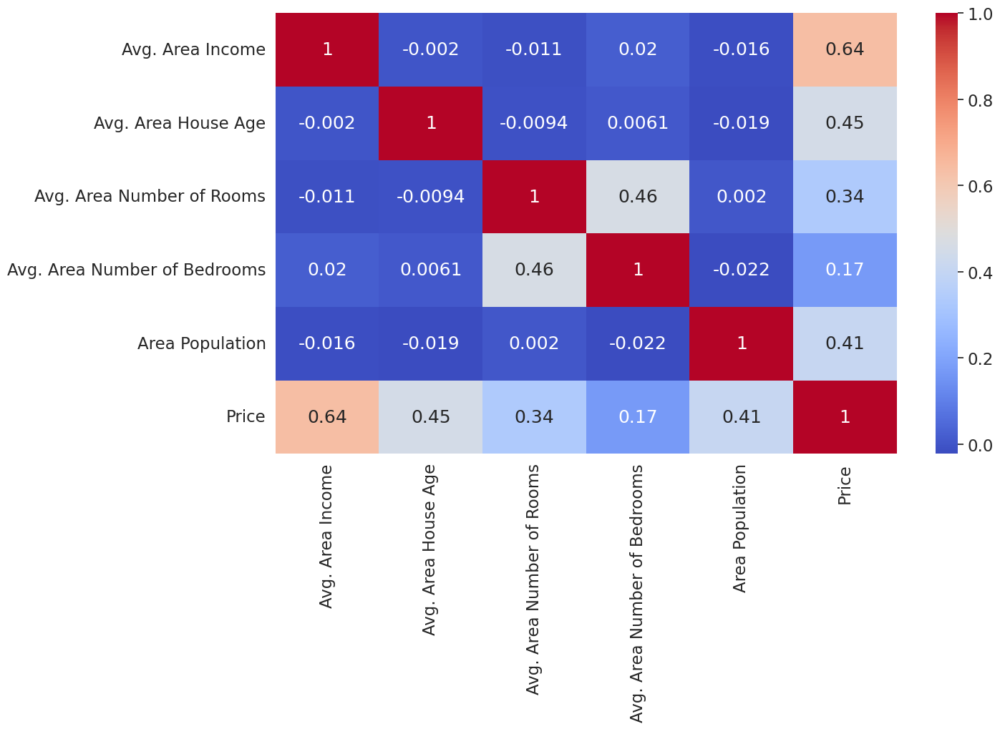

In [14]:
import seaborn as sns
import pandas as pd

# Assuming USAhousing is already loaded as a DataFrame
# Select only the numeric columns for correlation
numeric_data = USAhousing.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numeric_data.corr()

# Plot the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')


let’s delve deeper by employing scatter plots to visually assess the linear relationships between individual features and the target variable.

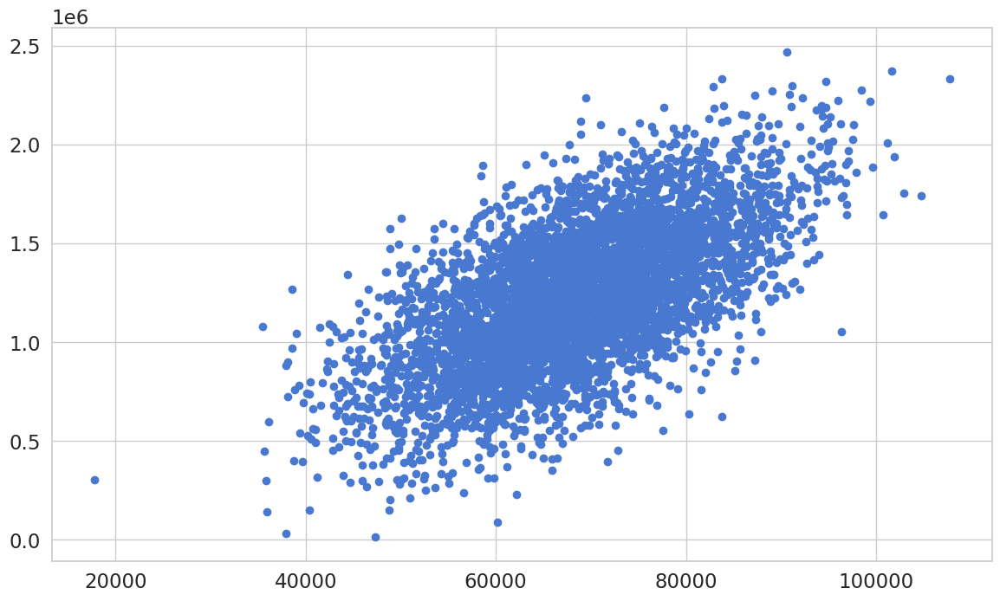

In [15]:
plt.scatter(USAhousing['Avg. Area Income'],USAhousing['Price'])


granular understanding of how each feature contributes to the predictive dynamics of the target variable.

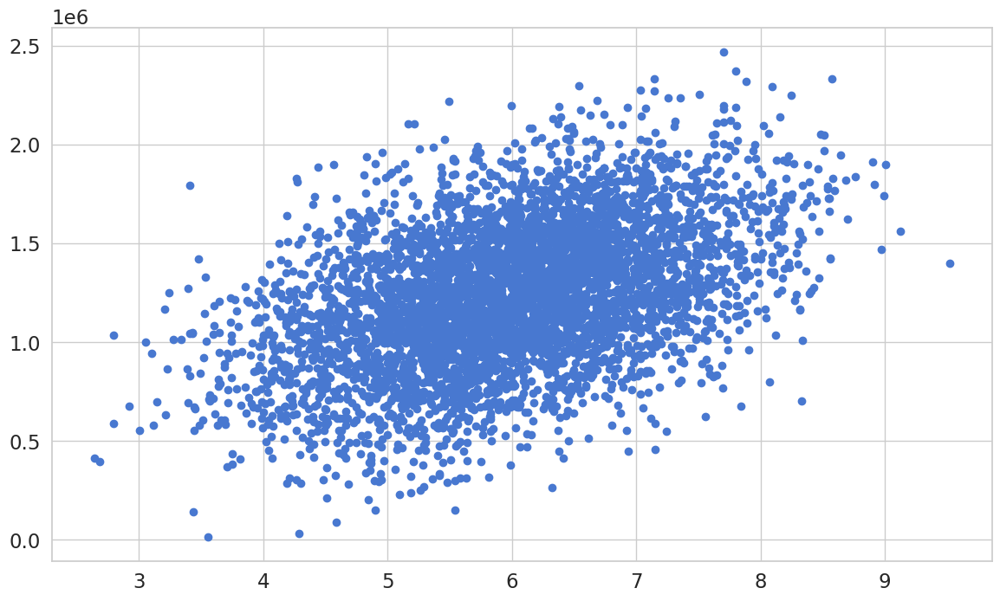

In [16]:
plt.scatter(USAhousing['Avg. Area House Age'],USAhousing['Price'])

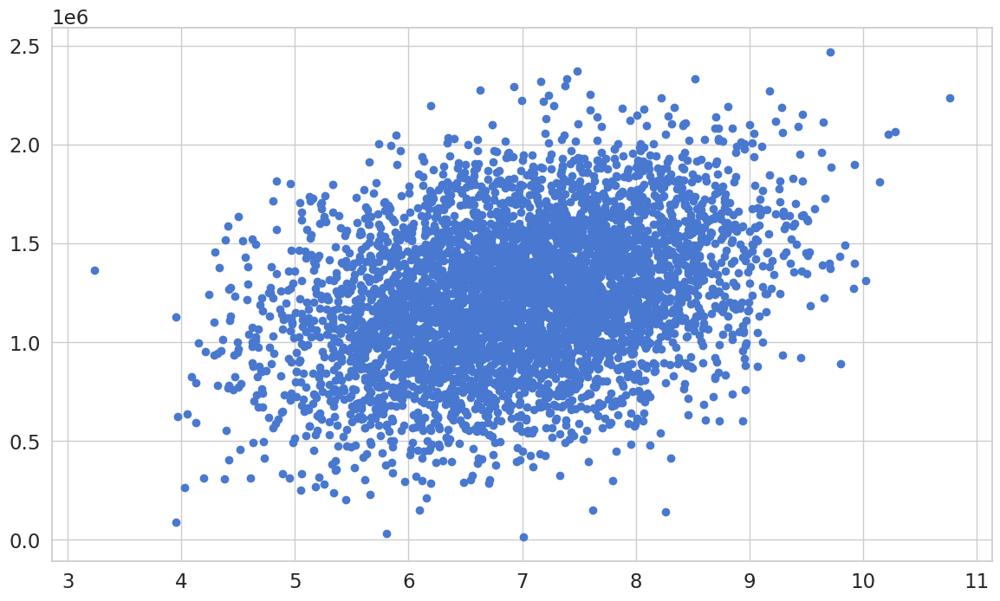

In [17]:
plt.scatter(USAhousing['Avg. Area Number of Rooms'],USAhousing['Price'])


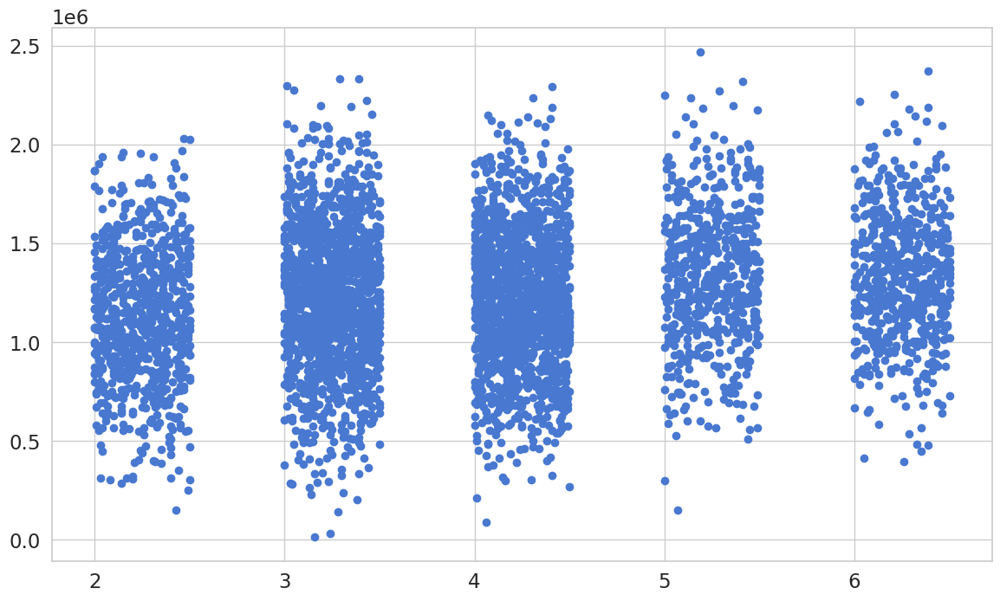

In [18]:
plt.scatter(USAhousing['Avg. Area Number of Bedrooms'],USAhousing['Price'])


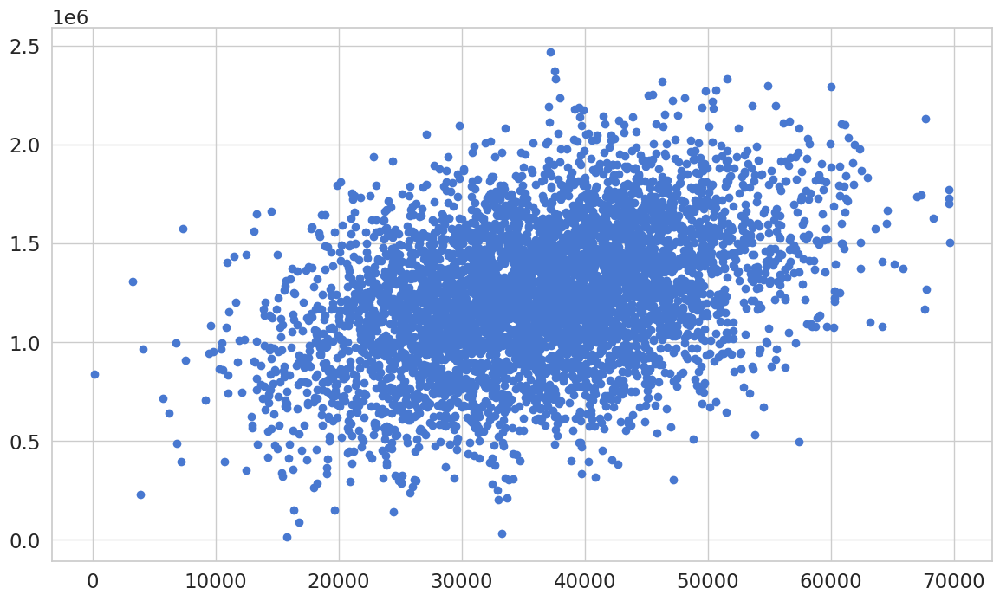

In [19]:
plt.scatter(USAhousing['Area Population'],USAhousing['Price'])


examining a pairplot

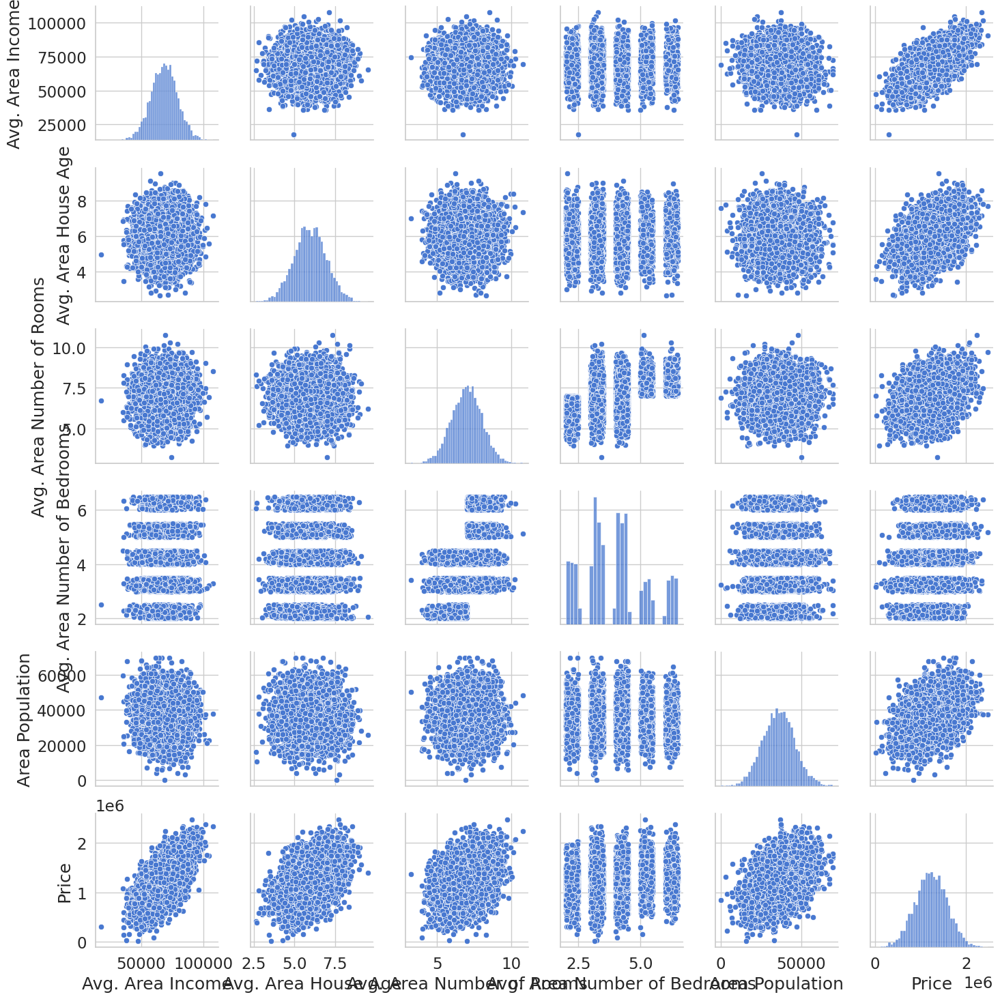

In [20]:
sns.pairplot(USAhousing)


<ipython-input-21-a7cd94cc3257>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(USAhousing['Price'])


<Axes: xlabel='Price', ylabel='Density'>

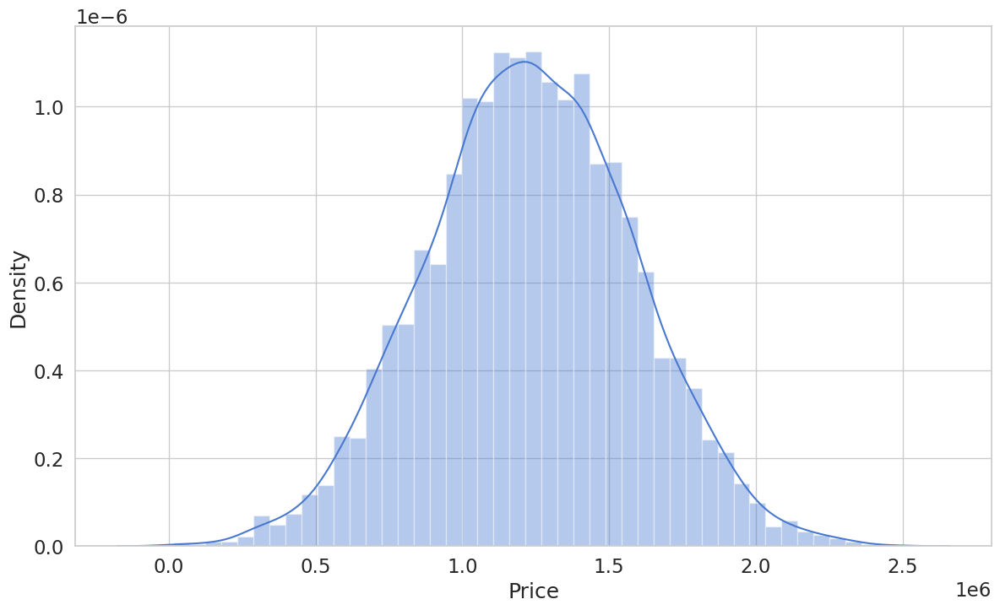

In [21]:
sns.distplot(USAhousing['Price'])


Model Selection


In [22]:
X = USAhousing[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
               'Avg. Area Number of Bedrooms', 'Area Population']]
y = USAhousing['Price']

Splitting the Data



In [23]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)


Import and Train Model

In [24]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X_train,y_train)


LinearRegression()

Model Prediction


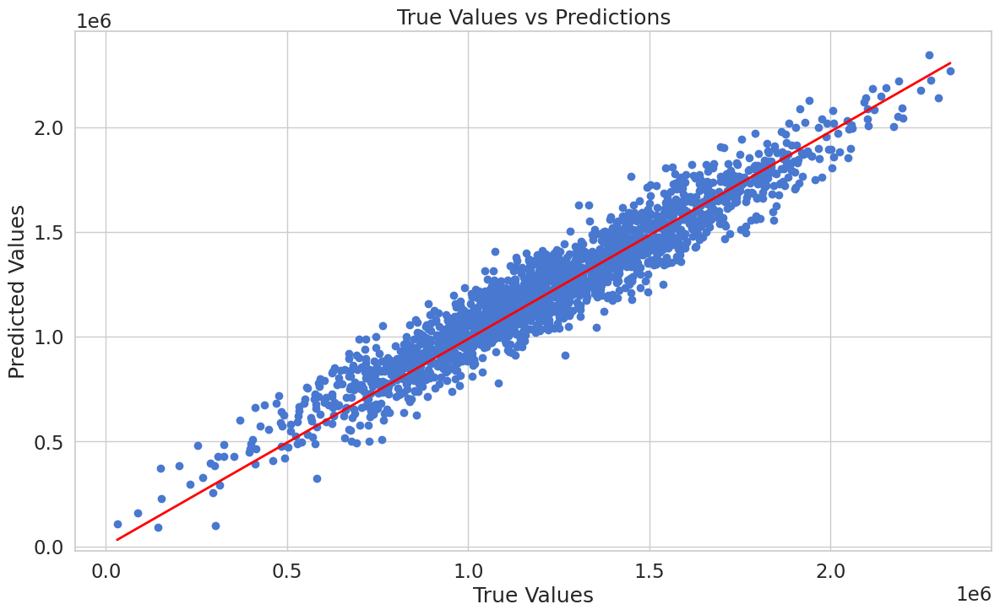

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc

# Assume lm is your linear model and predictions are already made
predictions = lm.predict(X_test)

# Set up the figure, axis, and plot elements
fig, ax = plt.subplots()
plt.title('True Values vs Predictions')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')

# Scatter plot of the true vs predicted values
ax.scatter(y_test, predictions)

# Initialize the line that will be animated
line, = ax.plot([], [], lw=2, color='red')

# Define the initialization function
def init():
    line.set_data([], [])
    return line,

# Define the animation function
def animate(i):
    # Generate a linear line for the current frame
    x_vals = np.linspace(min(y_test), max(y_test), 100)

    # Here, we simulate the line evolving over time
    # You could modify this to reflect an actual model's training process
    slope = i / 100  # This is an example; replace with actual logic
    intercept = 0  # Example intercept, replace with actual intercept

    y_vals = slope * x_vals + intercept

    # Update the line data
    line.set_data(x_vals, y_vals)

    return line,

# Create the animation object
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=100, blit=True)

# Display the animation
rc('animation', html='jshtml')
anim


Model Evaluation


In [26]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 82288.22251914942
MSE: 10460958907.208977
RMSE: 102278.82922290897
